##### CSCI 303
# Introduction to Data Science
<p/>
### 15 - Classification via Logistic Regression

![logistic regression classification](logistic_regression.png) 

## This Lecture
---
- Classification via Logistic Regression

## Setup
---

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sklearn as sk

from scipy.stats import norm
from pandas import Series, DataFrame
from sklearn.model_selection import train_test_split
from matplotlib.colors import ListedColormap

plt.style.use('ggplot')

%matplotlib inline
%config InlineBackend.figure_format = 'svg'

## Classification Review
---
In classification, we try to predict a *class label* assigning points to groups.

Our classification training data has the same kinds of inputs as in regression, but the *target* variable is discrete, not continuous.

E.g., the training data might include features about a borrower's financial history, credit score, owning/renting history, etc.  The target might be an indicator on whether or not the borrower ultimately defaulted on their loan.

The learning task is to find a *classifier* function which will let us predict future defaults given the same information about a potential borrower.


## Example Problem
---
This is the synthetic example problem from our previous discussion.

In [3]:
# ensure repeatability of this notebook 
# (comment out for new results each run)
np.random.seed(0)

def f(X):
    return 3 + 0.5 * X - X**2 + 0.15 * X**3

# convenience function for generating samples
def sample(n, fn, limits, sigma):
    
    width = limits[1] - limits[0]
    height = limits[3] - limits[2]
    x = np.random.random(n) * width + limits[0]
    y = np.random.random(n) * height + limits[2]
    
    s = y > fn(x)
    p = norm.cdf(np.abs(y - fn(x)), scale = sigma) # assigns p with normally distributed values according to its CDF
    r = np.random.random(n) # r is assigned n random variables from [0.0, 1.0).
    
    def assign(sign, prob, rnum):
        if sign:
            if rnum > prob:
                return 'b'
            else:
                return 'a'
        else:
            if rnum > prob:
                return 'a'
            else:
                return 'b'
        
    c = [assign(s[i], p[i], r[i]) for i in range(n)]
    return DataFrame({'x' : x, 'y' : y, 'class' : c})
    

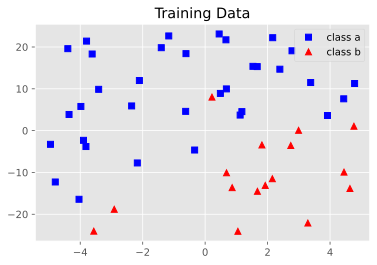

In [4]:
data = sample(100, f, [-5, 5, -25, 25], 5)
train, test = train_test_split(data, test_size = 0.5)
traina = train[train['class']=='a']
trainb = train[train['class']=='b']
plt.plot(traina['x'], traina['y'],'bs', label='class a')
plt.plot(trainb['x'], trainb['y'],'r^', label='class b')
plt.legend()
plt.title('Training Data')
plt.show()

## Instance-based versus Parametric
---
Instance based methods like *k*-nearest neighbor (KNN), which we used last time, *remember* all of the training data, and use it in making new predictions.

We'll study additional instance based methods when we return to regression.

Parametric methods (like ordinary least square linear regression) try to learn a parameterized function, e.g.
$$
\begin{align}
    \hat f(\mathbf{x}) & = 1 w_0 + x_1 w_1 + ... + x_k w_k \\
                   & = \phi \cdot \mathbf{w}
\end{align}
$$

For this lecture we look at parameterized methods for classification.

## Why Not Linear Regression?
---
Our classification problem asks us to determine which of two classes we belong to.

What if we simply turned our two classes into numerical values?

Can we do linear regression on the resulting problem?

First, we expand our DataFrame with a numerical class column:

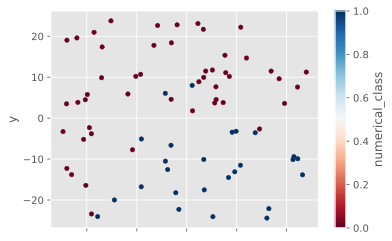

In [5]:
# expand data with numerical class
data['numerical_class'] = 0
data.loc[data['class'] == 'b', 'numerical_class'] = 1
train, test = train_test_split(data)
train.plot(figsize=(6,4), kind='scatter', x='x', y='y', c='numerical_class', colormap='RdBu')
plt.show()

Now we train using linear regression:

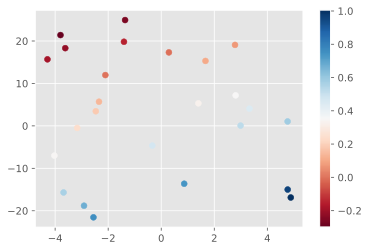

In [6]:
from sklearn import linear_model
model = linear_model.LinearRegression()
model.fit(train[['x','y']], train['numerical_class'])
plt.figure(figsize=(6,4))
plt.scatter(test['x'], test['y'], c = model.predict(test[['x','y']]), cmap = 'RdBu')
plt.colorbar()
plt.show()
#model.predict(test[['x','y']])

As we can see, this sort of works; our results are no longer discrete values, but we can set a threshold value: say, everything above 0.5 we'll treat as 1, otherwise 0.  Note, though, that some values got set even lower than zero, and some higher than 1, so the scale doesn't provide us good guidance as to where to set the threshold value!

## Logistic Regression
---
Logistic regression takes a slightly different approach.

Rather than modeling the two classes as numbers, it attempts to model the *probability* of belonging in one or the other class.

In logistic regression, we fit the model using the *logistic function*, which has a sigmoid shape:
$$
    p(\mathbf{x})  = \frac{e^{1 w_0 + x_1 w_1 + ... + x_k w_k}}{1 + e^{1 w_0 + x_1 w_1 + ... + x_k w_k}}
$$


The technique used to find the fit is called the *maximum likelihood* method, and is beyond the scope of this course.

Fortunately, we can just ask scikit-learn to do the work for us!

In [7]:
model = linear_model.LogisticRegression()
model.fit(train[['x','y']], train['class'])


LogisticRegression()

Using plotting code from last time, we can see the predictions and the mis-classified points.

In [8]:
def plot_predicted_1(model, test):
    predicted = model.predict(test[['x','y']])
    correct = test[test['class'] == predicted]
    correcta = correct[correct['class'] == 'a']
    correctb = correct[correct['class'] == 'b']
    incorrect = test[test['class'] != predicted]
    incorrecta = incorrect[incorrect['class'] == 'b'] # predicts a but was actually b -> incorrect on a
    incorrectb = incorrect[incorrect['class'] == 'a'] # predicts b but was actually a -> incorrect on b
    
    # plotting the properly classified data
    plt.plot(correcta['x'], correcta['y'], 'bs', label='a')
    plt.plot(correctb['x'], correctb['y'], 'r^', label='b')
    
    # plotting the misclassified data
    plt.plot(incorrecta['x'], incorrecta['y'], 'bs', markerfacecolor='w', label='a (misclassified)')
    plt.plot(incorrectb['x'], incorrectb['y'], 'r^', markerfacecolor='w', label='b (misclassified)')
    plt.legend(loc='upper left', ncol=2, framealpha=1)

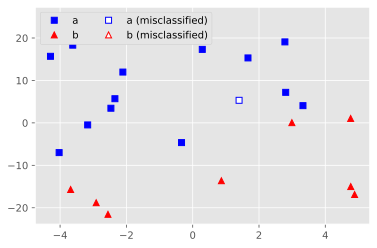

In [9]:
plot_predicted_1(model, test)

The logistic regression model also yields a *decision function*, which gives back the distance for each point from the dividing hyperplane, yielding a kind of confidence interval:

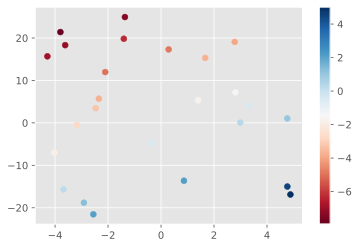

In [10]:
plt.figure(figsize=(6,4))
plt.scatter(test['x'], test['y'], c=model.decision_function(test[['x','y']]), cmap='RdBu')
plt.colorbar()
plt.show()

Also recall that we were estimating class membership probabilities.  We can retrieve these probabilities and plot them, as well.

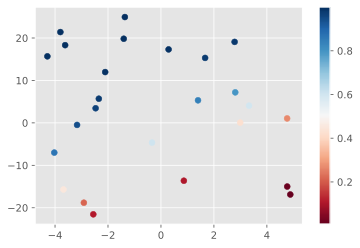

In [11]:
plt.figure(figsize=(6,4))
plt.scatter(test['x'], test['y'], c=model.predict_proba(test[['x','y']])[:,0], cmap='RdBu')
plt.colorbar()
plt.show()

As before, we can visualize the decision boundary by simply plotting all the points in our plane:

In [12]:
def plot_predicted_2(model, test):
    cmap = ListedColormap(['#8888FF','#FF8888'])
    xmin, xmax, ymin, ymax = -5, 5, -25, 25
    grid_size = 0.2
    xx, yy = np.meshgrid(np.arange(xmin, xmax, grid_size), 
                         np.arange(ymin, ymax, grid_size))
    pp = model.predict(np.c_[xx.ravel(), yy.ravel()])
    zz = np.array([{'a':0,'b':1}[ab] for ab in pp]) 
    zz = zz.reshape(xx.shape)
    plt.figure()
    plt.pcolormesh(xx, yy, zz, cmap = cmap)
    plot_predicted_1(model, test)

In [13]:
plot_predicted_2(model, test)
plt.show()

<ipython-input-12-9f392a34979d>:11: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(xx, yy, zz, cmap = cmap)


We can also plot the probabilities in the plane:

In [14]:
def plot_probabilities(model, test):
    cmap = 'RdBu'
    xmin, xmax, ymin, ymax = -5, 5, -25, 25
    grid_size = 0.2
    xx, yy = np.meshgrid(np.arange(xmin, xmax, grid_size), 
                         np.arange(ymin, ymax, grid_size))
    pp = model.predict_proba(np.c_[xx.ravel(), yy.ravel()])[:,0]
    zz = pp.reshape(xx.shape)
    plt.figure()
    plt.pcolormesh(xx, yy, zz, cmap = cmap)
    plt.colorbar()
    plot_predicted_1(model, test)

In [15]:
plot_probabilities(model, test)
plt.show()

<ipython-input-14-eeb08b7d48da>:10: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(xx, yy, zz, cmap = cmap)


## Higher Order Logistic Regression
---
As with our linear regression example, we can extend our model using additional *features*, at the possible risk of overfitting.

Let's try a couple of simple polynomial models.

Using sklearn.preprocessing.PolynomialFeatures, we can generate polynomial expansions of our base features to whatever degree desired; however, note that with multiple base features, the size grows very fast!

In our synthetic example, we have x and y input variables.  So a degree-2 polynomial feature set will give us features $(1, x, y, x^2, xy, y^2)$

In [16]:
from sklearn.preprocessing import PolynomialFeatures

pf = PolynomialFeatures(degree=2)
pf.fit(train[['x','y']])
Phi = pf.transform(train[['x','y']])

In [17]:
model = linear_model.LogisticRegression()
model.fit(Phi, train['class'])

LogisticRegression()

Our plotting function needs a quick revision to handle the PolynomialFeatures setup:

In [18]:
def plot_probabilities_polynomial(model, test, degree):
    pf = PolynomialFeatures(degree=degree)
    cmap = 'RdBu'
    xmin, xmax, ymin, ymax = -5, 5, -25, 25
    grid_size = 0.2
    xx, yy = np.meshgrid(np.arange(xmin, xmax, grid_size), 
                         np.arange(ymin, ymax, grid_size))

    pf.fit(np.c_[xx.ravel(), yy.ravel()])
    pp = model.predict_proba(pf.transform(np.c_[xx.ravel(), yy.ravel()]))[:,0]
    zz = pp.reshape(xx.shape)
    plt.figure()
    plt.pcolormesh(xx, yy, zz, cmap = cmap)
    plt.colorbar()
    
    pf.fit(test[['x','y']])
    predicted = model.predict(pf.transform(test[['x','y']]))
    correct = test[test['class'] == predicted]
    correcta = correct[correct['class'] == 'a']
    correctb = correct[correct['class'] == 'b']
    incorrect = test[test['class'] != predicted]
    incorrecta = incorrect[incorrect['class'] == 'b']
    incorrectb = incorrect[incorrect['class'] == 'a']
    
    plt.plot(correcta['x'], correcta['y'], 'bs', label='a')
    plt.plot(correctb['x'], correctb['y'], 'r^', label='b')
    plt.plot(incorrecta['x'], incorrecta['y'], 'bs', markerfacecolor='w', label='a (misclassified)')
    plt.plot(incorrectb['x'], incorrectb['y'], 'r^', markerfacecolor='w', label='b (misclassified)')
    plt.legend(loc='upper left', ncol=2, framealpha=1)    

In [22]:
plot_probabilities_polynomial(model, test, 2) # shows a second degree test. Notice the difference in the shape of the hyperplane!
plt.show()

<ipython-input-18-b8b3f4cee489>:13: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(xx, yy, zz, cmap = cmap)


We should also get our score on the test set:

In [23]:
pf.fit(test[['x','y']])
print(model.score(pf.transform(test[['x','y']]), test['class']))
sk.metrics.confusion_matrix(model.predict(pf.transform(test[['x','y']])), test['class'])

0.8


array([[15,  4],
       [ 1,  5]], dtype=int64)

Should we get crazy and try a degree-3 polynomial???

In [24]:
pf = PolynomialFeatures(degree=3)
pf.fit(train[['x','y']])
Phi = pf.transform(train[['x','y']])
model = linear_model.LogisticRegression()
model.fit(Phi, train['class'])

C:\Users\Owner\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [25]:
plot_probabilities_polynomial(model, test, 3)

<ipython-input-18-b8b3f4cee489>:13: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(xx, yy, zz, cmap = cmap)


Score:

In [26]:
pf.fit(test[['x','y']])
print(model.score(pf.transform(test[['x','y']]), test['class']))
sk.metrics.confusion_matrix(model.predict(pf.transform(test[['x','y']])), test['class'])

0.8


array([[15,  4],
       [ 1,  5]], dtype=int64)

Should we get really, really crazy and try a degree-4 polynomial???

In [27]:
pf = PolynomialFeatures(degree=5)
pf.fit(train[['x','y']])
Phi = pf.transform(train[['x','y']])
model = linear_model.LogisticRegression()
model.fit(Phi, train['class'])

C:\Users\Owner\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [28]:
plot_probabilities_polynomial(model, test, 5)

<ipython-input-18-b8b3f4cee489>:13: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(xx, yy, zz, cmap = cmap)


Now we begin to see signs of possible overfitting!

Test score:

In [29]:
pf.fit(test[['x','y']])
print(model.score(pf.transform(test[['x','y']]), test['class']))
sk.metrics.confusion_matrix(model.predict(pf.transform(test[['x','y']])), test['class'])

0.84


array([[15,  3],
       [ 1,  6]], dtype=int64)

## Next Time
---
More classification goodness!